# Exercise 8: Clustering stocks using KMeans

In this exercise, you'll cluster companies using their daily stock price movements (i.e. the dollar difference between the closing and opening prices for each trading day).  You are given a NumPy array `movements` of daily price movements from 2010 to 2015, where each row corresponds to a company, and each column corresponds to a trading day.

Some stocks are more expensive than others.  To account for this, include a `Normalizer` at the beginning of your pipeline.  The Normalizer will separately transform each company's stock price to a relative scale before the clustering begins.

## Normalizer vs StandardScaler
Note that `Normalizer()` is different to `StandardScaler()`, which you used in the previous exercise. While `StandardScaler()` standardizes **features** (such as the features of the fish data from the previous exercise) by removing the mean and scaling to unit variance, `Normalizer()` rescales **each sample** - here, each company's stock price - independently of the other.

This dataset was obtained from the Yahoo! Finance API.

From the course _Transition to Data Science_. [Buy the entire course for just $10](https://www.udemy.com/transition-to-data-science-in-python/?couponCode=CLUSTER-NBS) for many more exercises and helpful video lectures.

**Step 1:** Load the data _(written for you)_

In [1]:
import pandas as pd

fn = './data/company-stock-movements-2010-2015-incl.csv'
stocks_df = pd.read_csv(fn, index_col=0)

**Step 2:** Inspect the first few rows of the DataFrame `stocks_df` by calling its `head()` function.

In [2]:

stocks_df.head()

,2010-01-04,2010-01-05,2010-01-06,2010-01-07,2010-01-08,2010-01-11,2010-01-12,2010-01-13,2010-01-14,2010-01-15,...,2013-10-16,2013-10-17,2013-10-18,2013-10-21,2013-10-22,2013-10-23,2013-10-24,2013-10-25,2013-10-28,2013-10-29
Apple,0.580000,-0.220005,-3.409998,-1.170000,1.680011,-2.689994,-1.469994,2.779997,-0.680003,-4.999995,...,0.320008,4.519997,2.899987,9.590019,-6.540016,5.959976,6.910011,-5.359962,0.840019,-19.589981
AIG,-0.640002,-0.650000,-0.210001,-0.420000,0.710001,-0.200001,-1.130001,0.069999,-0.119999,-0.500000,...,0.919998,0.709999,0.119999,-0.480000,0.010002,-0.279998,-0.190003,-0.040001,-0.400002,0.660000
Amazon,-2.350006,1.260009,-2.350006,-2.009995,2.960006,-2.309997,-1.640007,1.209999,-1.790001,-2.039994,...,2.109985,3.699982,9.570008,-3.450013,4.820008,-4.079986,2.579986,4.790009,-1.760009,3.740021
American express,0.109997,0.000000,0.260002,0.720002,0.190003,-0.270001,0.750000,0.300004,0.639999,-0.130001,...,0.680001,2.290001,0.409996,-0.069999,0.100006,0.069999,0.130005,1.849999,0.040001,0.540001
Boeing,0.459999,1.770000,1.549999,2.690003,0.059997,-1.080002,0.360000,0.549999,0.530002,-0.709999,...,1.559997,2.480003,0.019997,-1.220001,0.480003,3.020004,-0.029999,1.940002,1.130005,0.309998


**Step 3:** Extract the NumPy array `movements` from the DataFrame and the list of company names (_written for you_)

In [3]:
companies = list(stocks_df.index)
movements = stocks_df.values

**Step 4:** Make the necessary imports:

- `Normalizer` from `sklearn.preprocessing`.
- `KMeans` from `sklearn.cluster`.
- `make_pipeline` from `sklearn.pipeline`.

In [4]:
from sklearn.preprocessing import Normalizer
from sklearn.cluster import KMeans
from sklearn.pipeline import make_pipeline

**Step 3:** Create an instance of `Normalizer` called `normalizer`.

In [5]:
normalizer = Normalizer()

**Step 4:** Create an instance of `KMeans` called `kmeans` with `14` clusters.

In [6]:
kmeans = KMeans(14)

**Step 5:** Using `make_pipeline()`, create a pipeline called `pipeline` that chains `normalizer` and `kmeans`.

In [8]:
pipeline = make_pipeline(normalizer, kmeans)

**Step 6:** Fit the pipeline to the `movements` array.

In [9]:
pipeline.fit(movements)

Pipeline(steps=[('normalizer', Normalizer()),
                ('kmeans', KMeans(n_clusters=14))])

**In the next exercise:** Let's check out your clustering!

In [10]:
predictions = pipeline.predict(movements)


# Visualization


In [16]:
stocks_df["cluster"] = predictions
grouped_df = stocks_df.groupby(["cluster"])


In [17]:
#display groups
grouped_df.groups

{0: ['ConocoPhillips', 'Chevron', 'Schlumberger', 'Valero Energy', 'Exxon'], 1: ['British American Tobacco', 'GlaxoSmithKline', 'Novartis', 'Pfizer', 'Royal Dutch Shell', 'SAP', 'Sanofi-Aventis', 'Total', 'Unilever'], 2: ['Boeing', 'Lookheed Martin', 'Northrop Grumman'], 3: ['Colgate-Palmolive', 'Johnson & Johnson', 'Kimberly-Clark', 'Procter Gamble', 'Wal-Mart'], 4: ['Canon', 'Ford', 'Google/Alphabet', 'Honda', 'Mitsubishi', 'Sony', 'Toyota'], 5: ['Dell', 'HP'], 6: ['Coca Cola', 'McDonalds', 'Pepsi', 'Philip Morris'], 7: ['Caterpillar', 'DuPont de Nemours', '3M', 'Navistar'], 8: ['Apple', 'Cisco', 'IBM', 'Intel', 'Microsoft', 'Symantec', 'Taiwan Semiconductor Manufacturing', 'Texas instruments'], 9: ['MasterCard'], 10: ['AIG', 'American express', 'General Electrics', 'Home Depot', 'Wells Fargo', 'Xerox'], 11: ['Walgreen'], 12: ['Bank of America', 'Goldman Sachs', 'JPMorgan Chase'], 13: ['Amazon', 'Yahoo']}

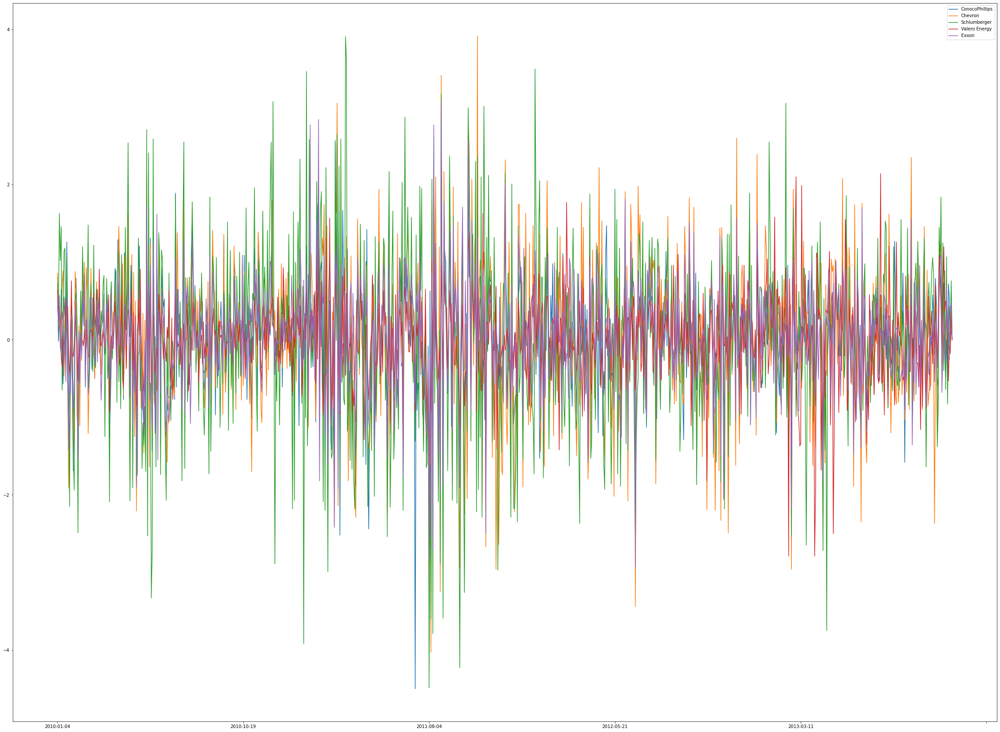

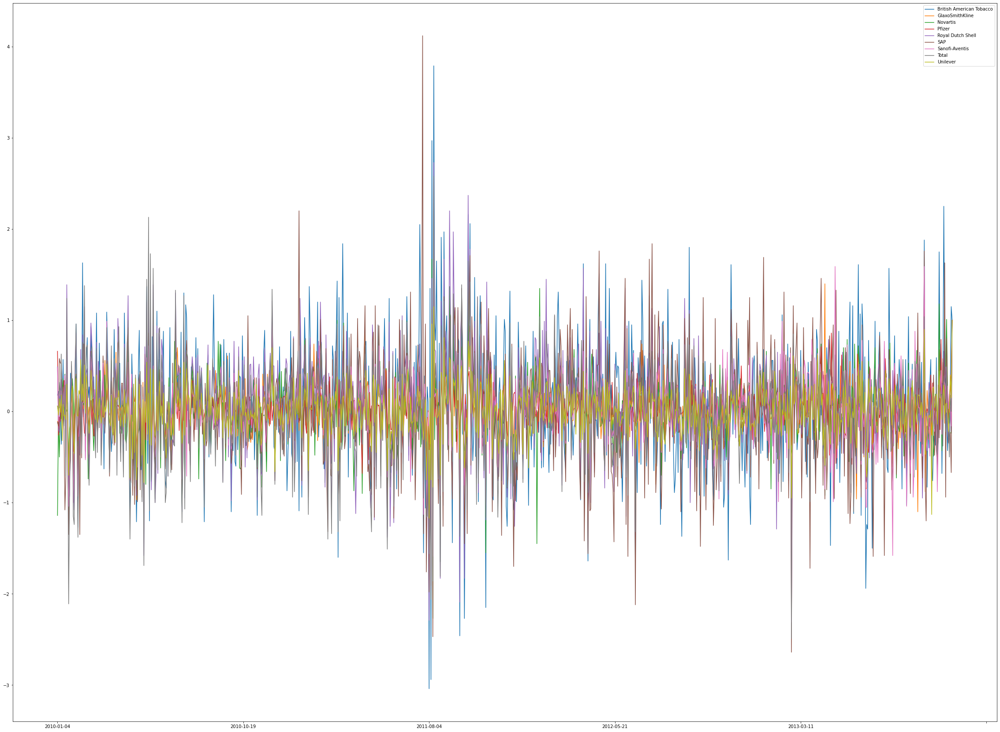

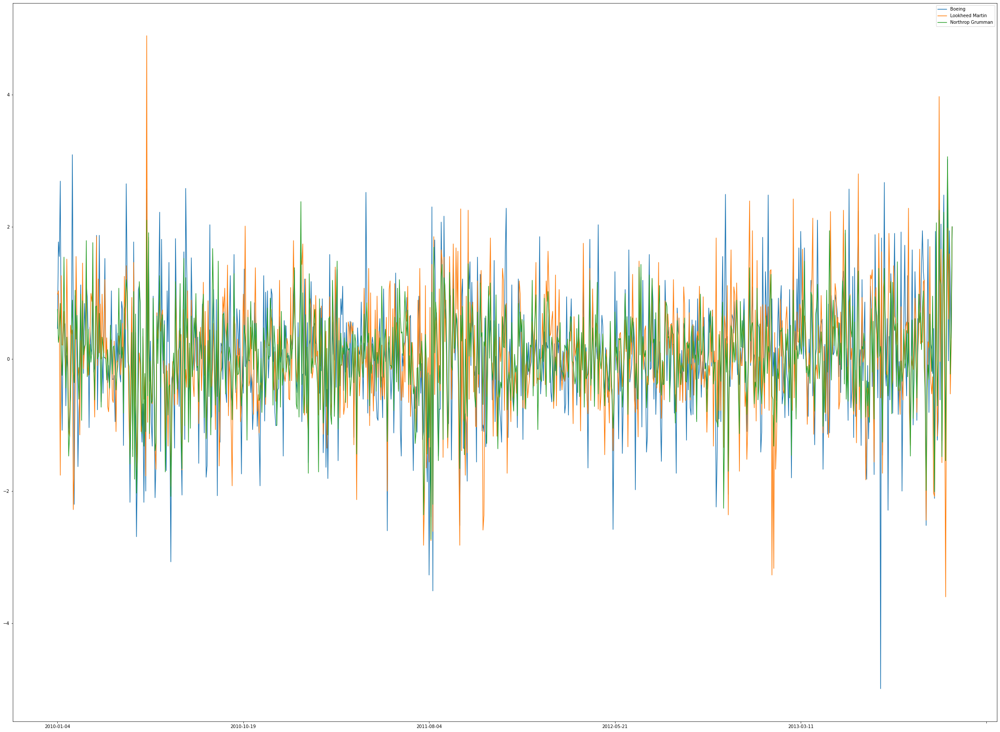

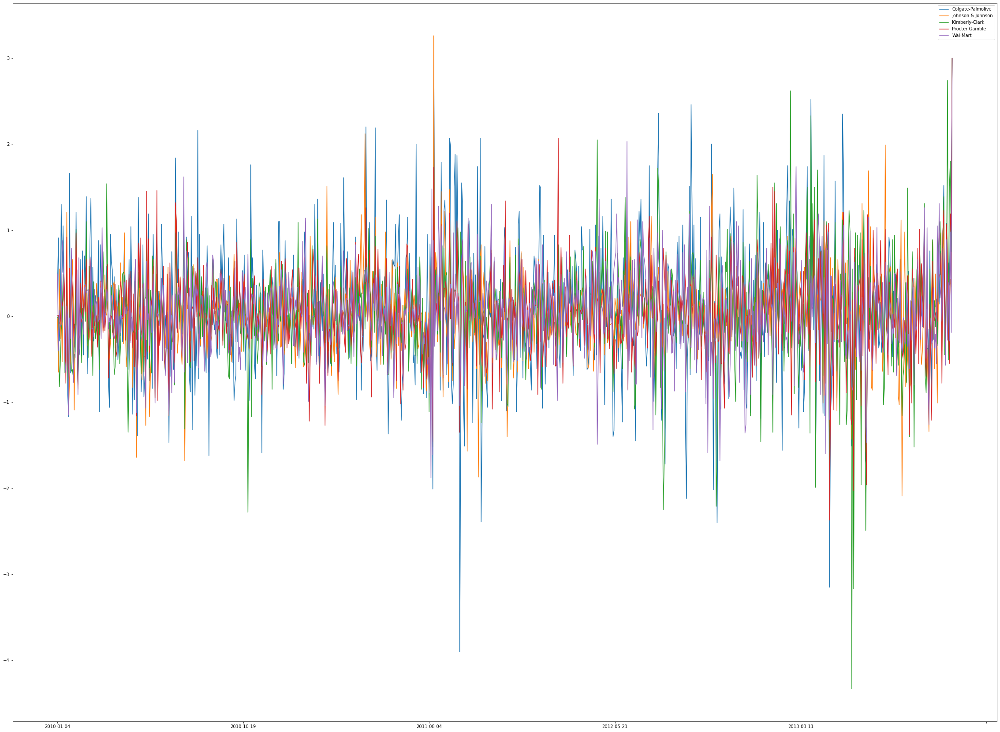

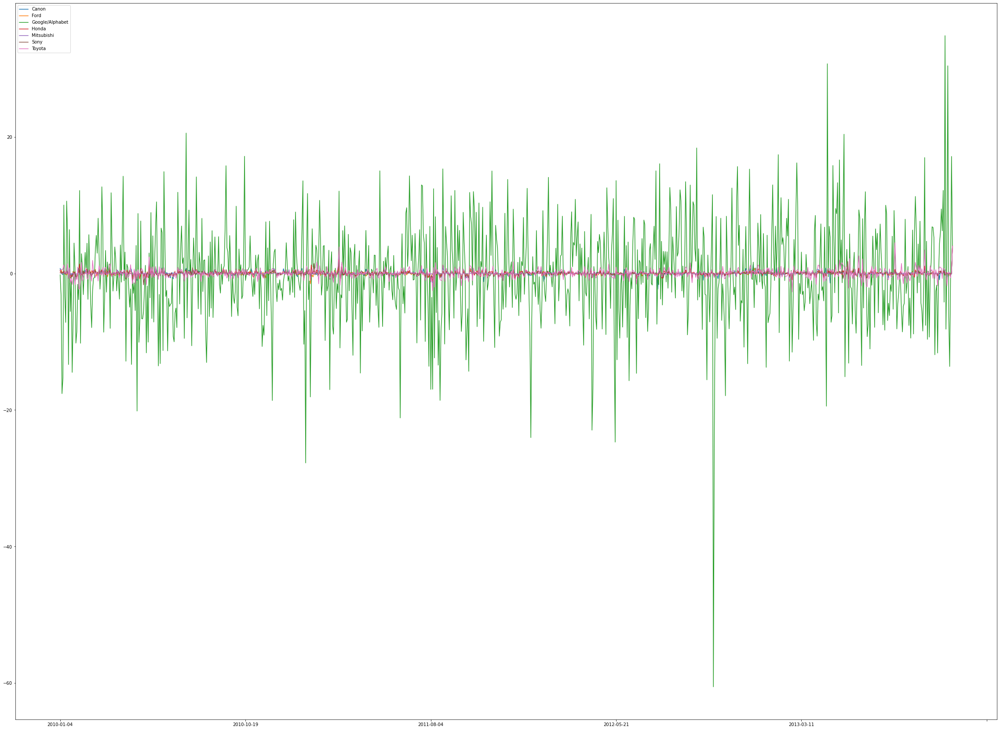

...

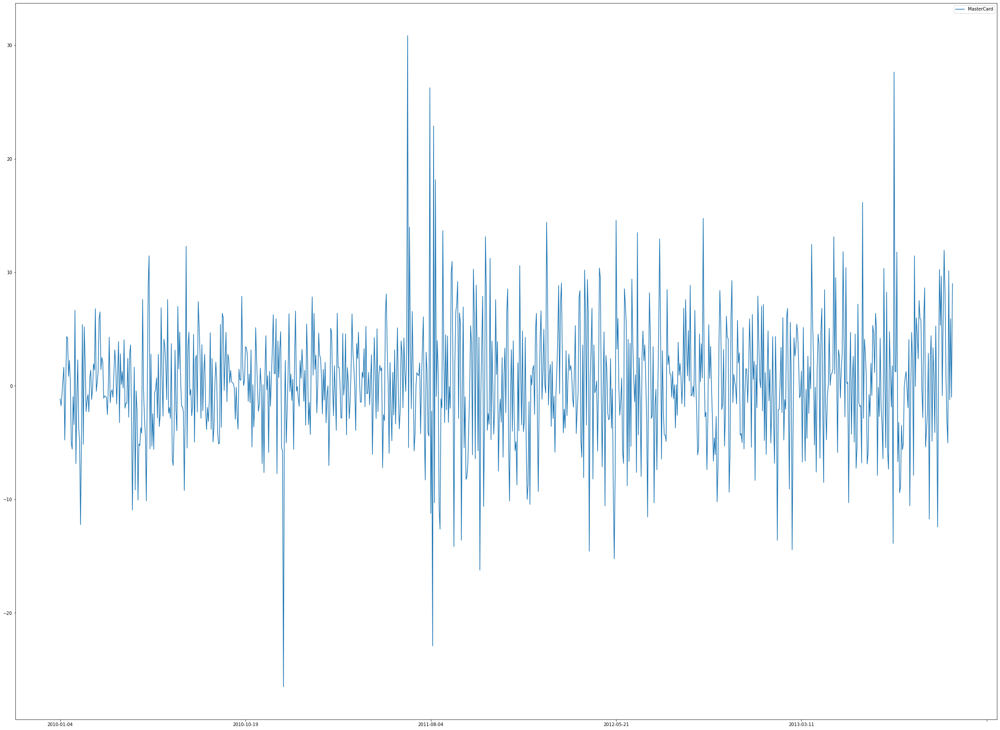

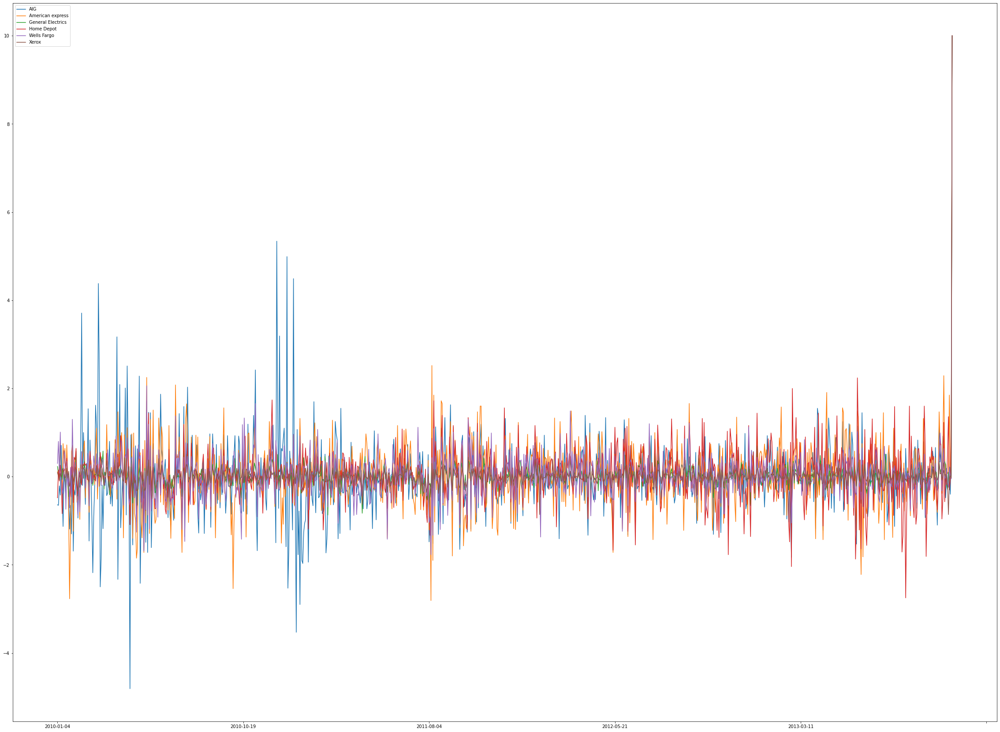

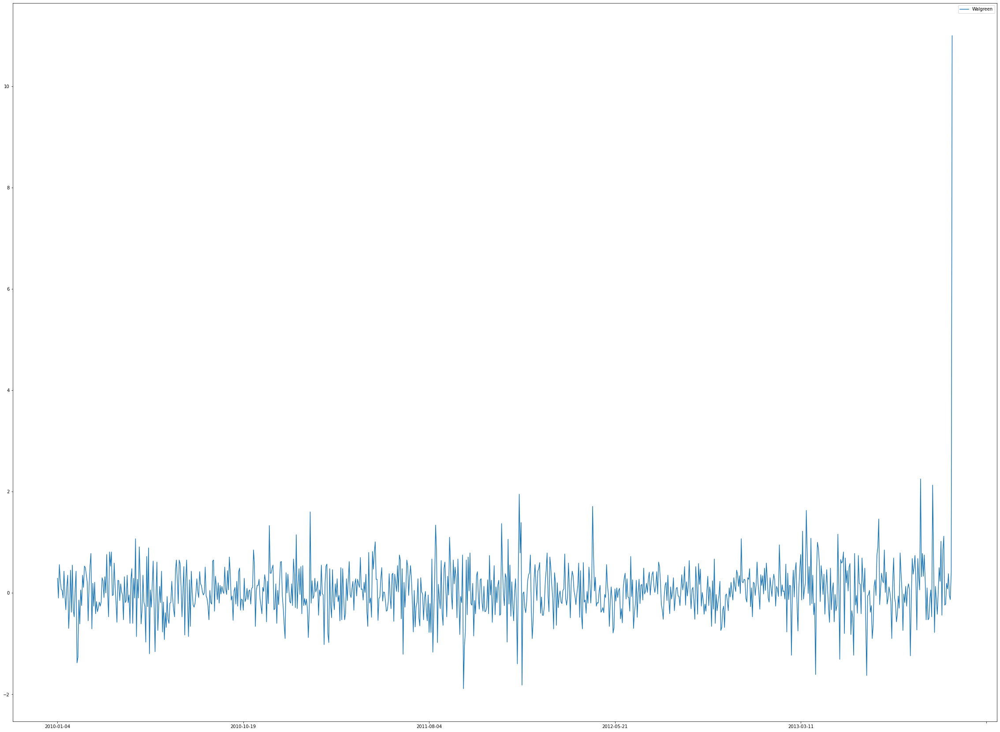

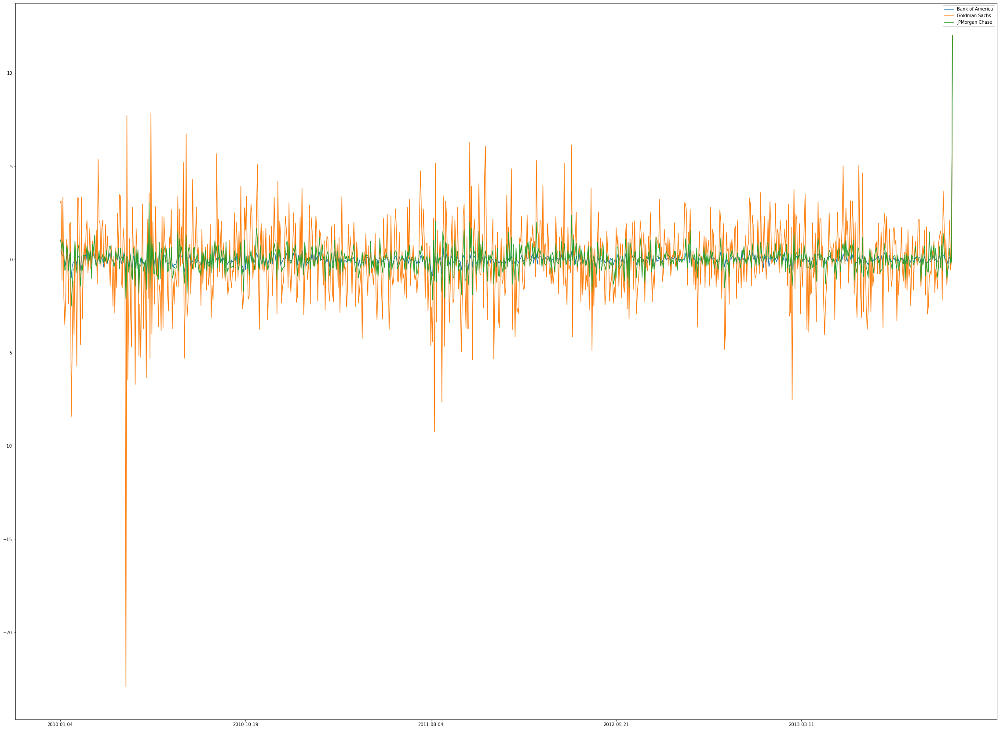

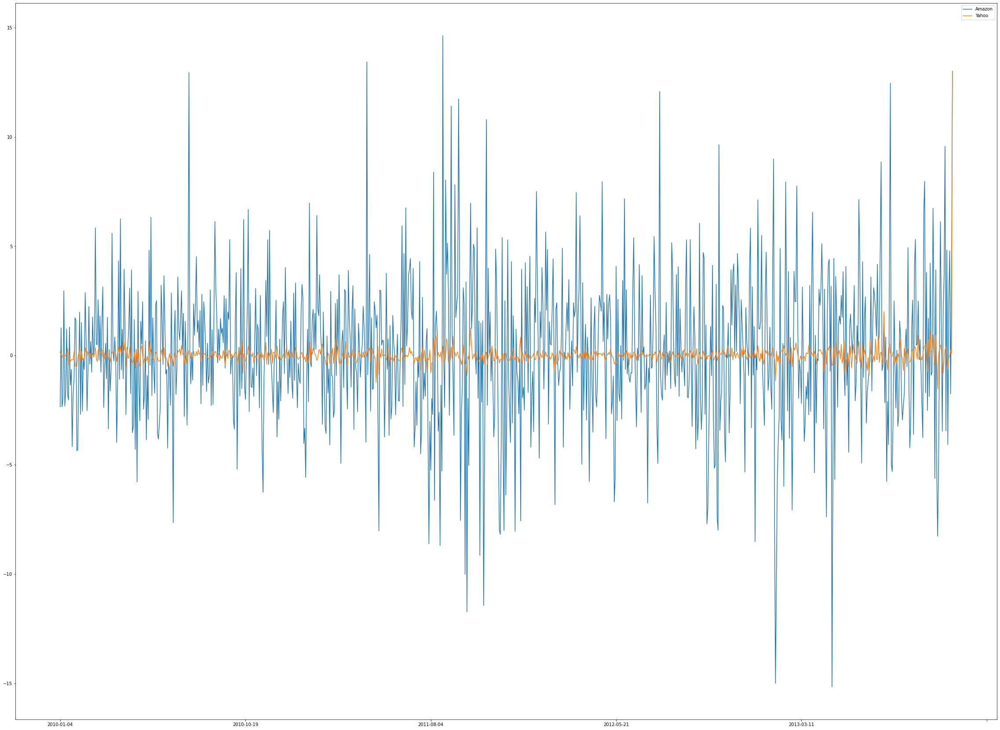

In [53]:
for group in grouped_df.groups:
    group1 = grouped_df.get_group(group)
    group1.transpose().plot(figsize=(40,30))

In [58]:
from sklearn.decomposition import PCA
pca = PCA(2)
values = pca.fit_transform(stocks_df.drop('cluster', axis=1))

In [67]:
values[:0]

array([], shape=(0, 2), dtype=float64)

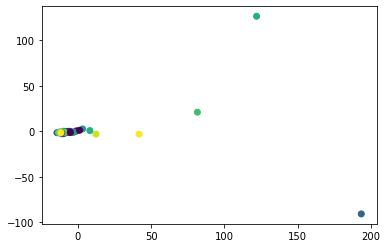

In [68]:
import matplotlib.pyplot as plt
plt.scatter(x=values[:,0], y=values[:,1], c=predictions)
plt.show()